In [1]:
# Django setup in notebook
import os
import sys
from pathlib import Path
from asgiref.sync import sync_to_async

# Load environment variables from /envs/1.env
from dotenv import load_dotenv
_ = load_dotenv('/home/mohammed/Desktop/tech_projects/growbal/envs/1.env')

# Ensure project root is on sys.path
PROJECT_ROOT = Path('/home/mohammed/Desktop/tech_projects/growbal/growbal_django')
if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

# Set Django settings module
os.environ.setdefault('DJANGO_SETTINGS_MODULE', 'growbal.settings')

import django
try:
    django.setup()
except Exception as e:
    raise RuntimeError(f"Failed to setup Django: {e}")

from django.contrib.auth import get_user_model
from accounts.models import ServiceProviderProfile

async def wait(coro):
    return await coro

print('Django initialized. Profiles count:', await wait(sync_to_async(ServiceProviderProfile.objects.count)()))


Django initialized. Profiles count: 482


In [2]:
# Install and import dependencies
import sys, subprocess

def ensure(package, import_name=None):
    try:
        __import__(import_name or package)
    except Exception:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "--quiet"])  # noqa
        __import__(import_name or package)

# Core libs
ensure('requests')
ensure('Pillow', 'PIL')

# # Search providers (prefer SerpAPI -> fallback DuckDuckGo)
# ensure('serpapi')
# ensure('duckduckgo-search', 'duckduckgo_search')

import os
import io
import math
import requests
from PIL import Image, ImageOps
from typing import List, Optional

# Read keys after loading .env
SERPER_API_KEY = os.getenv('SERPER_API_KEY')
print('SERPER_API_KEY set?', bool(SERPER_API_KEY))

SERPER_API_KEY set? True


In [3]:
# Image search and processing utilities
from typing import Dict, Any
from urllib.parse import quote_plus
from IPython.display import display
import requests

USER_AGENT = (
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 "
    "(KHTML, like Gecko) Chrome/126.0 Safari/537.36"
)


def search_logo_images_for_profile(profile: ServiceProviderProfile, *, max_results: int = 15) -> list[dict]:
    query_parts = [profile.website if profile.website else profile.name]
    if profile.country and not profile.website:
        query_parts.append(profile.country)
    query = " ".join([p for p in query_parts if p])

    results: list[dict] = []


    try:
        headers = {"X-API-KEY": SERPER_API_KEY, "Content-Type": "application/json"}
        payload = {"q": query, "num": max_results, "type": "images"}
        resp = requests.post("https://google.serper.dev/images", headers=headers, json=payload, timeout=20)
        resp.raise_for_status()
        data = resp.json()
        for item in data.get('images', [])[:max_results]:
            url = item.get('imageUrl') or item.get('original') or item.get('link')
            if not url:
                continue
            results.append({
                'url': url,
                'thumbnail': item.get('thumbnailUrl') or item.get('imageUrl'),
                'source': item.get('source') or item.get('domain'),
                'title': item.get('title')
            })
        if results:
            return results[:max_results]
    except Exception as e:
        print(f"Serper search failed: {e}")


def fetch_image(url: str, *, timeout: int = 15) -> Optional[Image.Image]:
    headers = {'User-Agent': USER_AGENT, 'Accept': 'image/avif,image/webp,image/apng,image/*,*/*;q=0.8'}
    try:
        resp = requests.get(url, headers=headers, timeout=timeout)
        resp.raise_for_status()
        img = Image.open(io.BytesIO(resp.content))
        # Convert to RGB to ensure consistent mode
        if img.mode not in ('RGB', 'RGBA'):
            img = img.convert('RGB')
        return img
    except Exception:
        return None


def resize_with_aspect(image: Image.Image, size: int = 512, *, background: str = 'white') -> Image.Image:
    """Resize maintaining aspect; pad to a square of `size`x`size` with background."""
    target = (size, size)
    fitted = ImageOps.contain(image, target)
    canvas = Image.new('RGB', target, color=background)
    x = (size - fitted.width) // 2
    y = (size - fitted.height) // 2
    canvas.paste(fitted, (x, y))
    return canvas


def build_grid(images: list[Image.Image], *, cols: int = 5, tile_size: int = 512, padding: int = 8, bg: str = '#f5f5f5') -> Image.Image:
    if not images:
        return Image.new('RGB', (tile_size, tile_size), color=bg)
    rows = math.ceil(len(images) / cols)
    grid_w = cols * tile_size + (cols + 1) * padding
    grid_h = rows * tile_size + (rows + 1) * padding
    grid = Image.new('RGB', (grid_w, grid_h), color=bg)
    for idx, im in enumerate(images):
        r = idx // cols
        c = idx % cols
        x = padding + c * (tile_size + padding)
        y = padding + r * (tile_size + padding)
        grid.paste(im, (x, y))
    return grid


def fetch_and_prepare_images(urls: list[str], *, desired: int = 15) -> list[Image.Image]:
    prepared: list[Image.Image] = []
    for url in urls:
        img = fetch_image(url)
        if not img:
            continue
        prepared.append(resize_with_aspect(img, 512))
        if len(prepared) >= desired:
            break
    return prepared


In [4]:
# Install and import Google Generative AI library
import sys, subprocess

def ensure(package, import_name=None):
    try:
        __import__(import_name or package)
    except Exception:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "--quiet"])
        __import__(import_name or package)

ensure('google-generativeai', 'google.generativeai')

import google.generativeai as genai
import json
from typing import List, Dict, Any

# Configure Gemini API
GEMINI_API_KEY = os.getenv('GEMINI_API_KEY')
print('GEMINI_API_KEY set?', bool(GEMINI_API_KEY))

# Initialize Gemini
genai.configure(api_key=GEMINI_API_KEY)
model = genai.GenerativeModel('gemini-2.0-flash')  # This is the model that works for both text and vision

print("Gemini API configured successfully")


GEMINI_API_KEY set? True
Gemini API configured successfully


/home/mohammed/anaconda3/envs/growbal/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
async def filter_out_human_logos(logo_results: List[Dict[str, Any]]) -> List[Dict[str, Any]]:
    """
    Filter out logo images that contain humans using Gemini Vision.
    Process all images in a single batch for efficiency.
    
    Args:
        logo_results: List of logo search results with url, title, source
        
    Returns:
        List of logo results that don't contain humans
    """
    if not logo_results:
        return []
    
    # First fetch all images
    images_info = []
    for idx, result in enumerate(logo_results[:15]):  # Limit to 15 for API efficiency
        try:
            img = await sync_to_async(fetch_image)(result['url'])
            if img:
                images_info.append({
                    'index': idx,
                    'image': img,
                    'result': result
                })
        except Exception as e:
            print(f"Error fetching image {result['url']}: {e}")
    
    if not images_info:
        return []
    
    try:
        # Prepare the prompt for batch analysis
        prompt = """
        You are analyzing a batch of potential logo images.
        For each image, determine if it contains any humans or human faces. Be hyper sensitive to the exisitence of humans in the image. If all the images contain humans filter them accordingly.
        
        Return a JSON array with results for each image.
        Format: [{"index": 0, "contains_humans": true/false}, ...]
        
        Return ONLY the JSON array, no other text.
        """
        
        # Create a list of images for the model
        images = [info['image'] for info in images_info]
        
        # Generate response from Gemini for all images
        response = await sync_to_async(model.generate_content)([prompt] + images)
        response_text = response.text.strip()
        
        # Clean up response if it contains markdown code blocks
        if '```json' in response_text:
            response_text = response_text.split('```json')[1].split('```')[0].strip()
        elif '```' in response_text:
            response_text = response_text.split('```')[1].split('```')[0].strip()
        
        # Parse the results
        results = json.loads(response_text)
        
        # Filter out images with humans
        filtered_results = []
        for result in results:
            idx = result['index']
            if idx < len(images_info) and not result.get('contains_humans', True):
                filtered_results.append(images_info[idx]['result'])
        
        print(f"Filtered out {len(logo_results) - len(filtered_results)} images containing humans")
        return filtered_results
        
    except Exception as e:
        print(f"Error in batch human detection: {e}")
        # On error, return all fetched images
        return [info['result'] for info in images_info]


In [6]:
def rank_logo_relevance_gemini(
    profile: ServiceProviderProfile, 
    logo_results: List[Dict[str, Any]], 
    top_k: int = 5
) -> List[Dict[str, Any]]:
    """
    Use Gemini to rank logo images based on relevance to the service provider profile.
    
    Args:
        profile: ServiceProviderProfile object with name and description
        logo_results: List of logo search results with url, title, source
        top_k: Number of top-ranked results to return
    
    Returns:
        List of top_k logo results sorted by relevance with added 'relevance_score' field
    """
    if not logo_results:
        return []
    
    # Prepare the context about the service provider
    profile_context = f"""
    Service Provider: {profile.name}
    Website: {profile.website or 'No website available'}
    Country: {profile.country or 'Not specified'}
    """
    
    # Prepare logo candidates information
    candidates_info = []
    for idx, result in enumerate(logo_results[:15]):  # Limit to 15 for API efficiency
        candidates_info.append({
            'index': idx,
            'title': result.get('title', ''),
            'source': result.get('source', ''),
            'url': result.get('url', '')
        })
    
    # Create the prompt for Gemini
    prompt = f"""
    You are helping to identify the most relevant logo for a business from image search results.
    
    Service Provider Profile:
    {profile_context}
    
    Logo Candidates:
    {json.dumps(candidates_info, indent=2)}
    
    Please analyze these logo search results and rank them by probibility that this is official business logo.
    Consider:
    1. Likelihood that this is an official or professional logo
    2. Match between the title/source and the business details
    3. Source credibility (official websites, LinkedIn, etc. are preferred)
    
    Return a JSON array of the top {top_k} most relevant candidates with scores.
    Format: [{{"index": 0, "relevance_score": 0.95, "reason": "brief explanation"}}, ...]
    
    Return ONLY the JSON array, no other text.
    """
    
    try:
        # Generate response from Gemini
        response = model.generate_content(prompt)
        
        # Parse the JSON response
        response_text = response.text.strip()
        # Clean up response if it contains markdown code blocks
        if '```json' in response_text:
            response_text = response_text.split('```json')[1].split('```')[0].strip()
        elif '```' in response_text:
            response_text = response_text.split('```')[1].split('```')[0].strip()
        
        rankings = json.loads(response_text)
        
        # Add relevance scores to the original results
        ranked_results = []
        for rank_info in rankings:
            idx = rank_info['index']
            if idx < len(logo_results):
                result = logo_results[idx].copy()
                result['relevance_score'] = rank_info.get('relevance_score', 0)
                result['ranking_reason'] = rank_info.get('reason', '')
                ranked_results.append(result)
        
        # Sort by relevance score (highest first)
        ranked_results.sort(key=lambda x: x.get('relevance_score', 0), reverse=True)
        
        return ranked_results[:top_k]
        
    except Exception as e:
        print(f"Error ranking with Gemini: {e}")
        # Fallback: return first top_k results as-is
        for idx, result in enumerate(logo_results[:top_k]):
            result['relevance_score'] = 1.0 - (idx * 0.1)  # Simple decreasing score
            result['ranking_reason'] = 'Fallback ranking'
        return logo_results[:top_k]


# Test the function
print("Gemini ranking function defined successfully")

Gemini ranking function defined successfully



Processing profile: BusinessBOX
Country: Qatar
Website: https://businessbox.me

Searching for logo images...
Found 8 logo candidates

Showing search results:


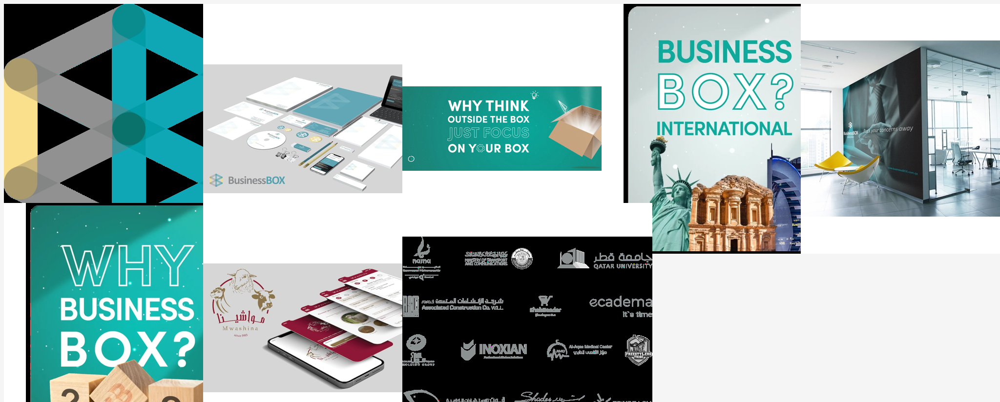


Filtering out images containing humans...
Filtered out 2 images containing humans
Remaining candidates after human filtering: 6

Showing filtered results (no humans):


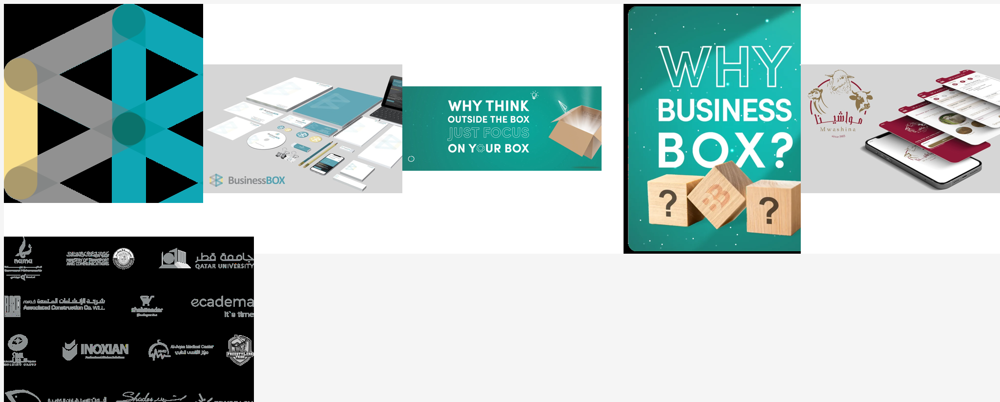


Ranking filtered logos with Gemini...

Top 2 ranked logos:

  1. Score: 0.95
     Title: BusinessBOX Qatar - Consulting | Branding | Digital
     Source: businessbox.me
     Reason: This logo is sourced directly from the BusinessBOX website (businessbox.me) and the title clearly id

  2. Score: 0.85
     Title: Portfolio – BusinessBOX Brand Identity - BusinessBOX!
     Source: BusinessBOX Qatar
     Reason: This image is sourced from the official BusinessBOX Qatar website and is explicitly labeled as part 


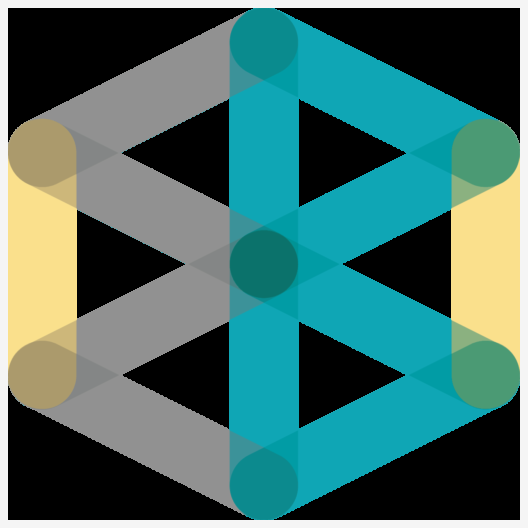




Processing profile: FCME Corporate Advisors
Country: UAE
Website: https://firstcalluae.com

Searching for logo images...
Found 8 logo candidates

Showing search results:


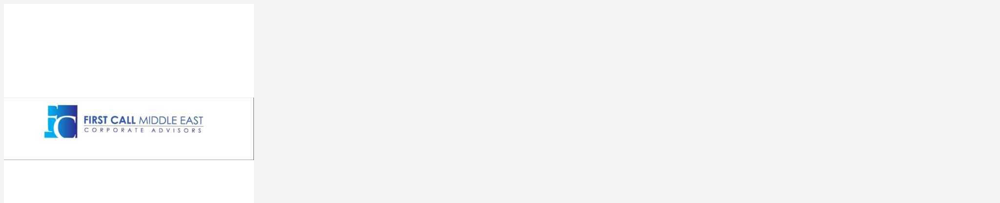


Filtering out images containing humans...
Filtered out 7 images containing humans
Remaining candidates after human filtering: 1

Showing filtered results (no humans):


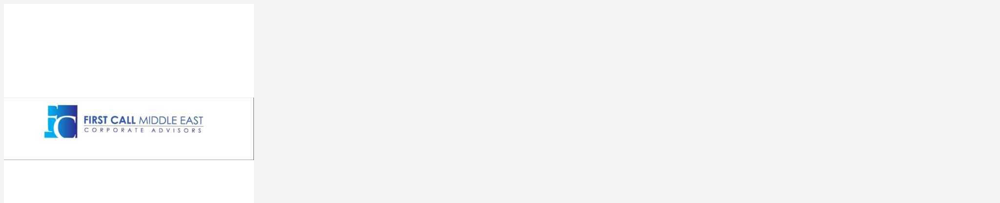


Ranking filtered logos with Gemini...

Top 1 ranked logos:

  1. Score: 0.85
     Title: Aftab Alam‏ - ‏Founder & CEO at First Call Middle East‏ | LinkedIn
     Source: LinkedIn
     Reason: The source is LinkedIn, and the title mentions 'First Call Middle East' along with a CEO, making it 


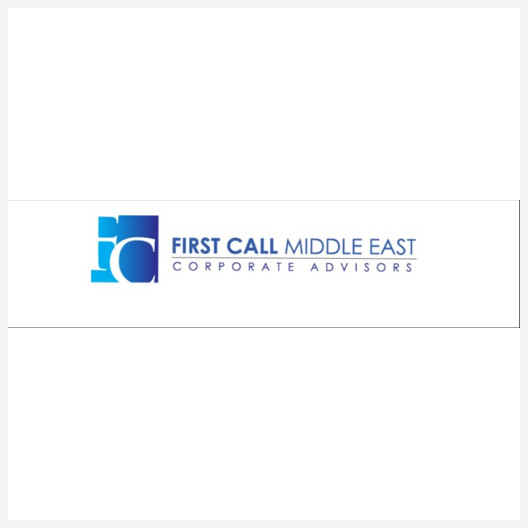




Processing profile: Al Motakamela Tax Consultancy L.L.C.
Country: UAE
Website: https://motakamela.com

Searching for logo images...
Found 8 logo candidates

Showing search results:


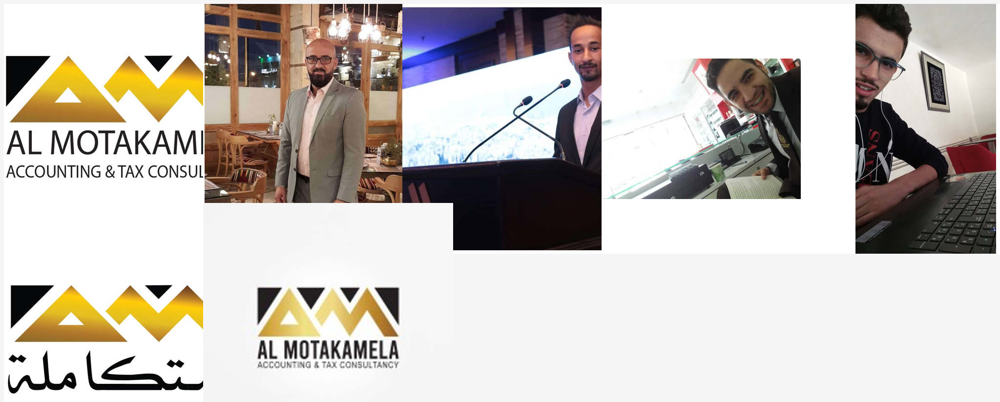


Filtering out images containing humans...
Filtered out 5 images containing humans
Remaining candidates after human filtering: 3

Showing filtered results (no humans):


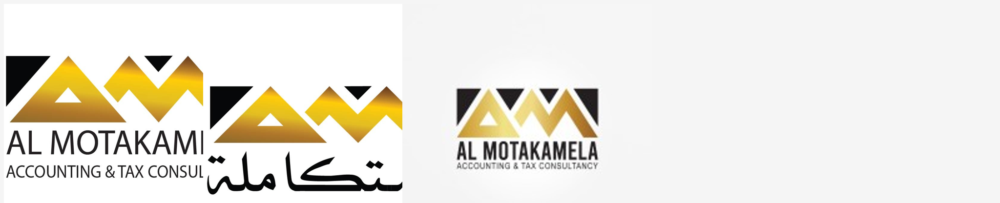


Ranking filtered logos with Gemini...

Top 2 ranked logos:

  1. Score: 0.95
     Title: Al Motakamela
     Source: motakamela.com
     Reason: This logo is hosted directly on the company's website (motakamela.com) and features the company name

  2. Score: 0.85
     Title: Al Motakamela Tax Consultancy | LinkedIn
     Source: LinkedIn
     Reason: This logo is sourced from the company's LinkedIn page, which is a credible source for official compa


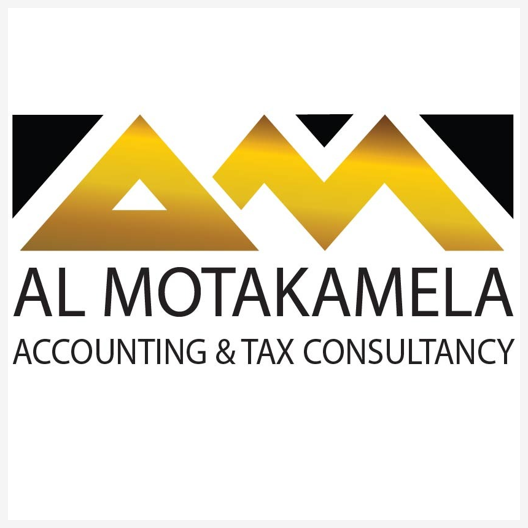




Processing profile: Askew CPA Consulting Firm, LLC
Country: USA
Website: https://askewcpafirm.com

Searching for logo images...
Found 8 logo candidates

Showing search results:


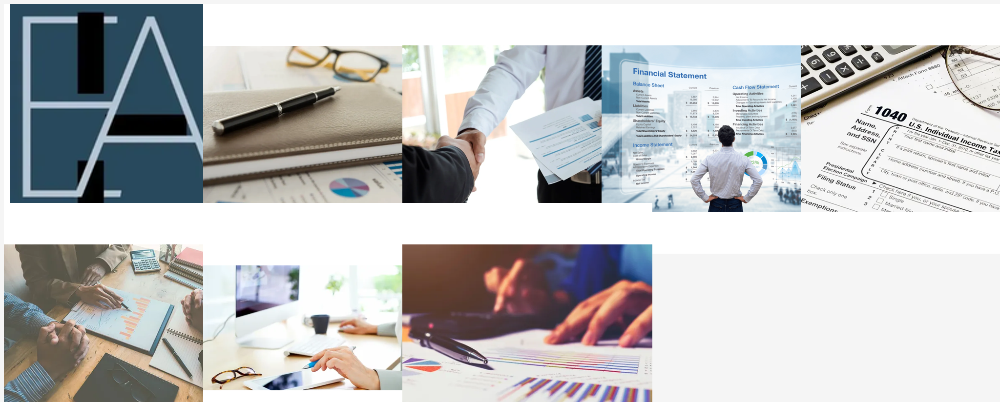


Filtering out images containing humans...
Filtered out 5 images containing humans
Remaining candidates after human filtering: 3

Showing filtered results (no humans):


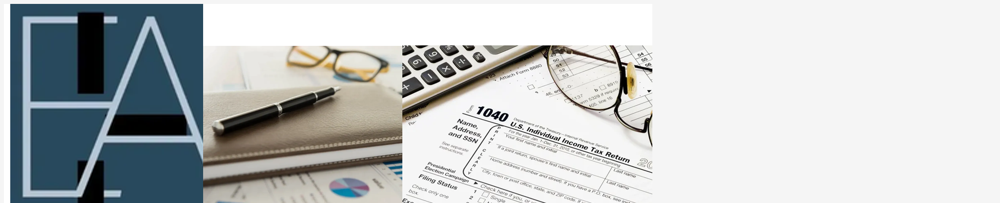


Ranking filtered logos with Gemini...

Top 2 ranked logos:

  1. Score: 0.95
     Title: Askew CPA Consulting Firm, LLC - Home
     Source: askewcpafirm.com
     Reason: This logo is sourced directly from the company's website (askewcpafirm.com) and the filename suggest

  2. Score: 0.90
     Title: Askew CPA Consulting Firm, LLC - Home
     Source: askewcpafirm.com
     Reason: This logo is sourced directly from the company's website (askewcpafirm.com). Although the filename i


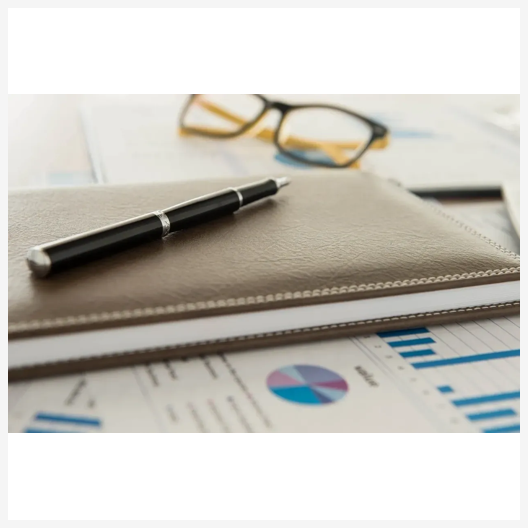




Processing profile: Escrow Consulting Group
Country: UAE
Website: https://escrowconsultinggroup.com

Searching for logo images...
Found 8 logo candidates

Showing search results:


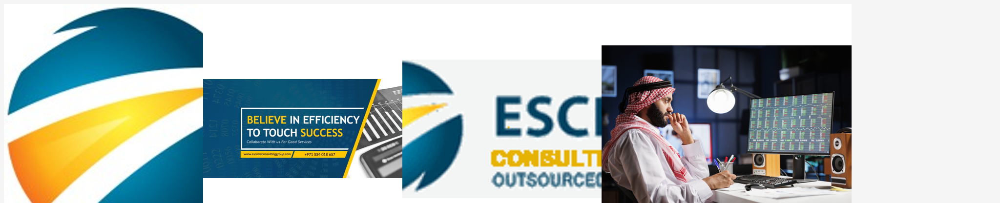


Filtering out images containing humans...
Filtered out 5 images containing humans
Remaining candidates after human filtering: 3

Showing filtered results (no humans):


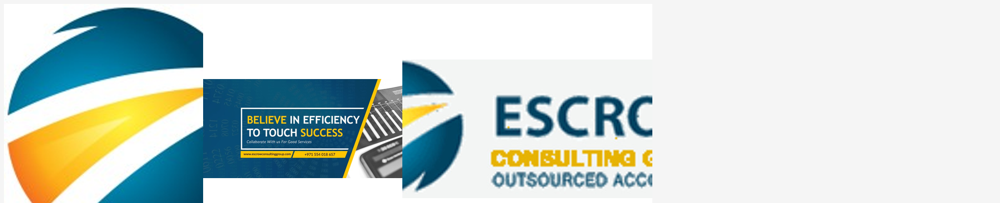


Ranking filtered logos with Gemini...

Top 2 ranked logos:

  1. Score: 0.95
     Title: Escrow Consulting Group | LinkedIn
     Source: LinkedIn
     Reason: This logo is sourced from LinkedIn, which is a credible source for business logos. The title directl

  2. Score: 0.85
     Title: Escrow Consulting Group | F6S
     Source: F6S
     Reason: This logo is sourced from F6S, which is a platform often used by businesses. The title contains the 


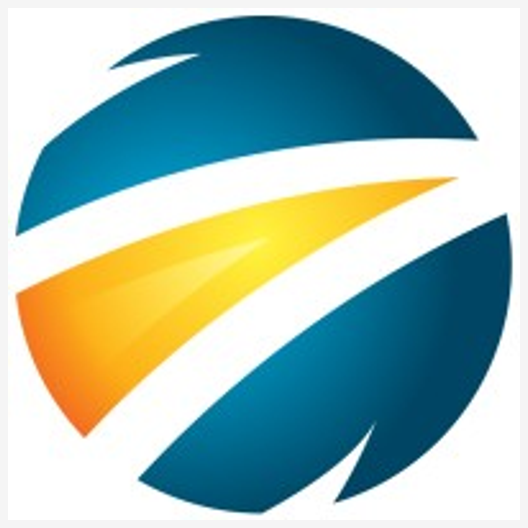




Processing profile: Globevisa Group
Country: UAE
Website: https://www.globevisa.ae

Searching for logo images...
Found 8 logo candidates

Showing search results:


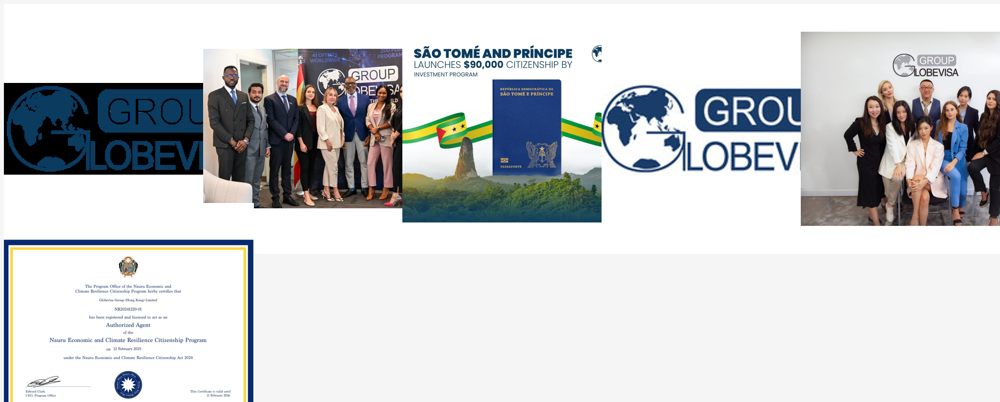


Filtering out images containing humans...
Filtered out 4 images containing humans
Remaining candidates after human filtering: 4

Showing filtered results (no humans):


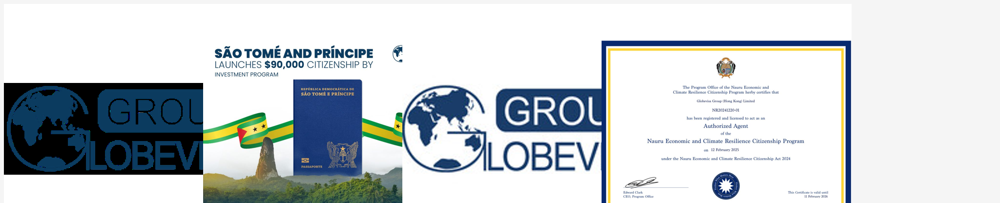


Ranking filtered logos with Gemini...

Top 2 ranked logos:

  1. Score: 0.95
     Title: Globevisa Gulf – Globevisa Group UAE – World leaders in ...
     Source: www.globevisa.ae
     Reason: This candidate is hosted on the official website (globevisa.ae) and the title clearly indicates it's

  2. Score: 0.85
     Title: Globevisa Group | LinkedIn
     Source: LinkedIn
     Reason: This candidate is sourced from LinkedIn, a credible platform for company logos. The title explicitly


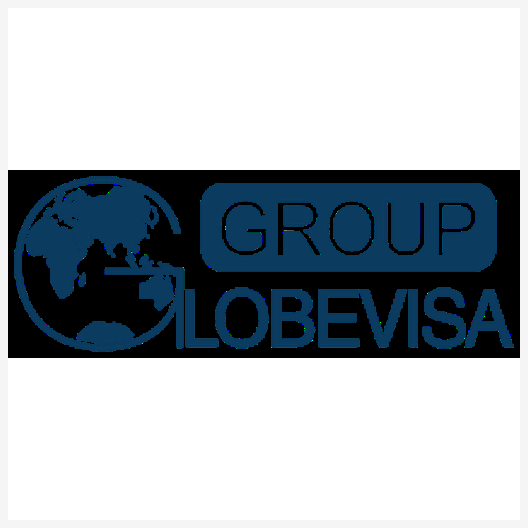




Processing profile: Timeless Pro Services
Country: UAE
Website: https://timelesspr.com

Searching for logo images...
Found 8 logo candidates

Showing search results:


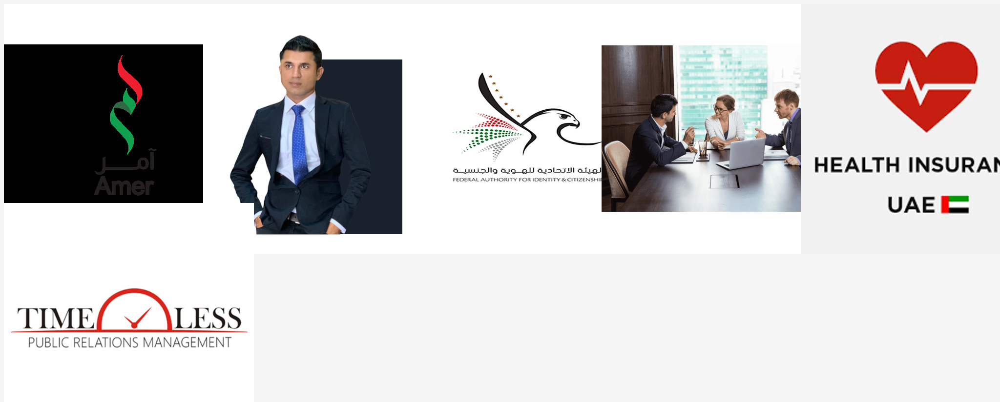


Filtering out images containing humans...
Filtered out 4 images containing humans
Remaining candidates after human filtering: 4

Showing filtered results (no humans):


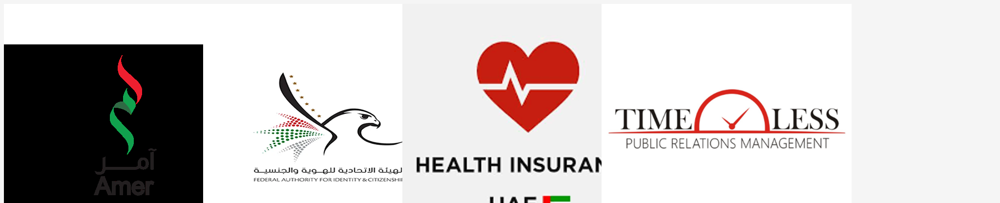


Ranking filtered logos with Gemini...

Top 2 ranked logos:

  1. Score: 0.95
     Title: Home - Timeless Pro Services
     Source: timelesspr.com
     Reason: This logo is hosted directly on the company's website (timelesspr.com), and the title clearly indica

  2. Score: 0.75
     Title: TIMELESS Public Relations Management (@TimelessPR) / X
     Source: X
     Reason: This logo is sourced from the company's X (formerly Twitter) profile, which is a credible source. Th


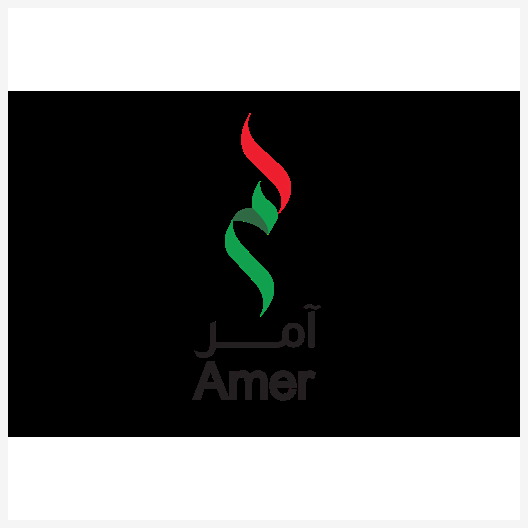




Processing profile: A1 Properties
Country: UAE
Website: https://a1properties.ae

Searching for logo images...
Found 8 logo candidates

Showing search results:


In [ ]:
# Add required imports
from django.db.models import Q
from accounts.models import ServiceProviderProfile
from asgiref.sync import sync_to_async

async def process_profiles(num_profiles: int = 3, max_candidates: int = 8):
    # Get profiles that need logos
    qs = ServiceProviderProfile.objects.filter(
        Q(logo__isnull=True) | 
        Q(logo="") |
        Q(logo__contains="logo-placeholder.png")
    ).order_by('?')
    # ).order_by('id')
    
    # Get multiple profiles
    profiles = await sync_to_async(lambda: list(qs[:num_profiles]))()
    
    for profile in profiles:
        print(f"\nProcessing profile: {profile.name}")
        print(f"Country: {profile.country or 'N/A'}")
        print(f"Website: {profile.website or 'N/A'}")
        
        # Search for logo images
        print("\nSearching for logo images...")
        results = await sync_to_async(search_logo_images_for_profile)(profile, max_results=max_candidates)
        print(f"Found {len(results)} logo candidates")
        
        # Display original search results
        print("\nShowing search results:")
        urls = [r['url'] for r in results[:max_candidates]]  # Show first 5
        prepared = await sync_to_async(fetch_and_prepare_images)(urls, desired=max_candidates)
        if prepared:
            grid = build_grid(prepared, cols=5, tile_size=400, padding=8)
            display(grid)
        
        # Filter out images containing humans
        print("\nFiltering out images containing humans...")
        filtered_results = await filter_out_human_logos(results)
        print(f"Remaining candidates after human filtering: {len(filtered_results)}")
        
        # Display filtered results
        if filtered_results:
            print("\nShowing filtered results (no humans):")
            urls = [r['url'] for r in filtered_results[:max_candidates]]
            prepared = await sync_to_async(fetch_and_prepare_images)(urls, desired=max_candidates)
            if prepared:
                grid = build_grid(prepared, cols=5, tile_size=400, padding=8)
                display(grid)
        
        # Now rank the filtered results with Gemini
        print("\nRanking filtered logos with Gemini...")
        ranked_results = await sync_to_async(rank_logo_relevance_gemini)(profile, filtered_results, top_k=2)
        
        # Display ranking results
        print(f"\nTop {len(ranked_results)} ranked logos:")
        for i, result in enumerate(ranked_results, 1):
            print(f"\n  {i}. Score: {result.get('relevance_score', 0):.2f}")
            print(f"     Title: {result.get('title', 'N/A')[:80]}")
            print(f"     Source: {result.get('source', 'N/A')}")
            print(f"     Reason: {result.get('ranking_reason', 'N/A')[:100]}")
        
        # Show the ranked images
        urls = [r['url'] for r in ranked_results]
        prepared = await sync_to_async(fetch_and_prepare_images)(urls, desired=1)
        if prepared:
            grid = build_grid(prepared, cols=1, tile_size=512, padding=8)
            display(grid)
        
        print("\n" + "="*80 + "\n")  # Add a separator between profiles

# Run the async function
await process_profiles(10)
